In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import numpy as np 
from bokeh.plotting import show, output_notebook
import pandas as pd
import socket
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/ImageSpot/jupyter-annotator/')
import tissue_tag as tt
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/ImageSpot/')
import visiumator as vm
import matplotlib.pyplot as plt
import scanpy as sc
output_notebook()
host = '5011'

Loading BokehJS ...

# Preprocessing (make sure allgnment is done properly!)

In [3]:
vis_path = '/nfs/team205/ny1/Visium/ThymusAtlasDataSet/set160222/V19D02-039_U11FO2_A1_st9518030/'
impath = '/nfs/team205/ny1/Visium/ThymusAtlasDataSet/set160222/V19D02-039_U11FO2_A1_st9518030/V19D02-039_U11-THY-FO2_A1H&E - 2020-12-02 10.11.43.jpg'

Scaling images and saving
Running Cellpose model for fiducial detection
   label  area  equivalent_diameter   perimeter  centroid-0   centroid-1
0      1  1983            50.247726  163.438600  170.414523  3686.647504
1      2  1923            49.481710  161.781746  170.842954  3226.855954
2      3  1935            49.635859  162.024387  171.896124  3594.752972
3      4  2257            53.606918  176.267027  173.011077  4337.108108
4      5  2153            52.357280  171.681241  172.673479  4605.949373
found - 591 Candidate points
[[0, 33], [1, 90], [2, 16], [3, 80], [7, 63], [8, 15], [9, 74], [12, 115], [15, 538], [17, 527], [20, 460], [21, 541], [22, 578], [23, 570], [25, 577], [26, 588]]
Finding Transformation Matrix
[[0, 33], [1, 90], [2, 16], [3, 80], [7, 63], [8, 15], [9, 74], [12, 115], [15, 538], [17, 527], [20, 460], [21, 541], [22, 578], [23, 570], [25, 577], [26, 588]]
[[ 4.40253213e+00 -1.66783704e-03 -1.29273023e+05]
 [-9.68487712e-04  4.39046753e+00 -1.74111074e+04]
 [ 

<Figure size 432x288 with 0 Axes>

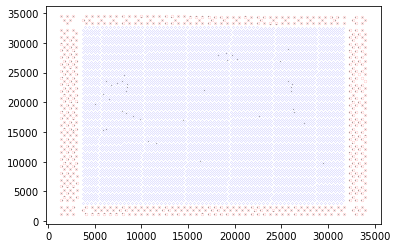

DONE!
Done!


<Figure size 1200x800 with 0 Axes>

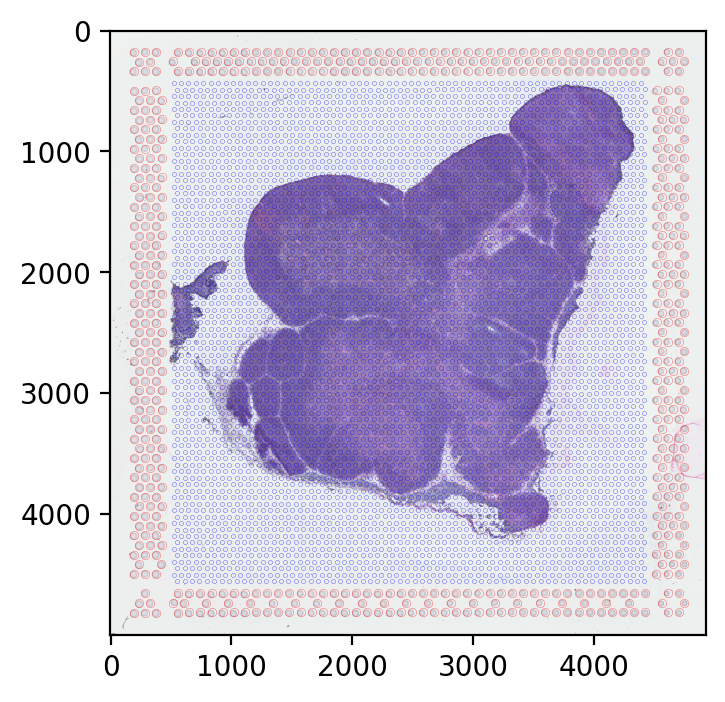

In [2]:
vm.align_and_extract(path_10x=vis_path,path_image=impath,ref_path='/nfs/team205/ny1/ThymusSpatialAtlas/ImageSpot/ReferenceData/',use_10X_allignment=False)

Otsu threhold found to be - 183.0
              Barcode  UnderTissue  Col  Row            X            Y
0  ACGCCTGACACGCGCT-1          0.0  0.0  0.0  3109.126533  3736.621064
1  TACCGATCCAACACTT-1          0.0  1.0  1.0  3492.063436  3956.060182
2  ATTAAAGCGGACGAGC-1          0.0  0.0  2.0  3108.959749  4175.667817
3  GATAAGGGACGATTAG-1          0.0  1.0  3.0  3491.896652  4395.106935
4  GTGCAAATCACCAATA-1          0.0  0.0  4.0  3108.792965  4614.714570


<Figure size 1200x800 with 0 Axes>

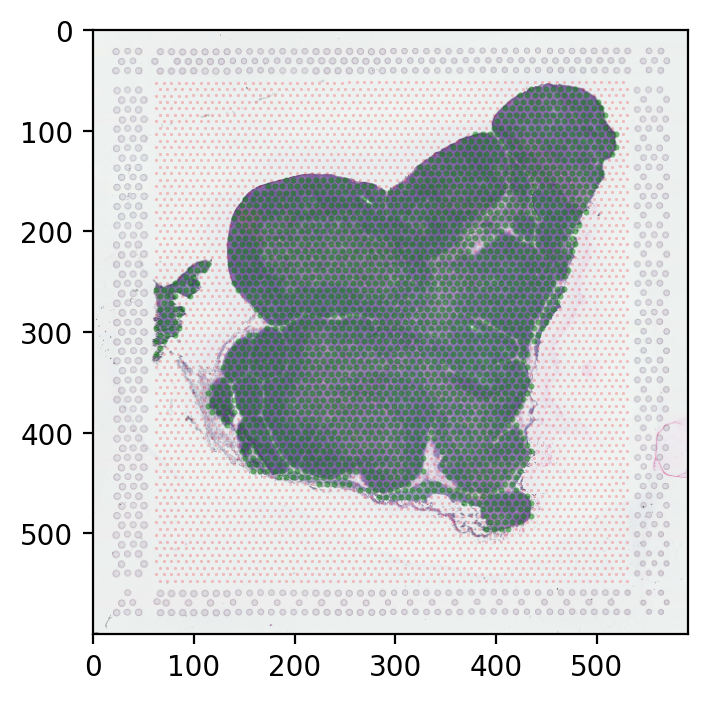

,Barcode,UnderTissue,Col,Row,X,Y
0,ACGCCTGACACGCGCT-1,0.0,0.0,0.0,3109.126533,3736.621064
1,TACCGATCCAACACTT-1,0.0,1.0,1.0,3492.063436,3956.060182
2,ATTAAAGCGGACGAGC-1,0.0,0.0,2.0,3108.959749,4175.667817
3,GATAAGGGACGATTAG-1,0.0,1.0,3.0,3491.896652,4395.106935
4,GTGCAAATCACCAATA-1,0.0,0.0,4.0,3108.792965,4614.714570
...,...,...,...,...,...,...
4987,GAACGTTTGTATCCAC-1,0.0,77.0,123.0,32591.432072,30731.508454
4988,ATTGAATTCCCTGTAG-1,0.0,76.0,124.0,32208.328385,30951.116089
4989,TACCTCACCAATTGTA-1,0.0,77.0,125.0,32591.265288,31170.555207
4990,AGTCGAATTAGCGTAA-1,0.0,76.0,126.0,32208.161601,31390.162842


In [3]:
vm.detect_tissue_otsu(path=vis_path,ref_path='/nfs/team205/ny1/ThymusSpatialAtlas/ImageSpot/ReferenceData/')

# Annoation with TissueTag

<Figure size 1000x1000 with 0 Axes>

Text(0.5, 1.0, 'ppm - 0.5')

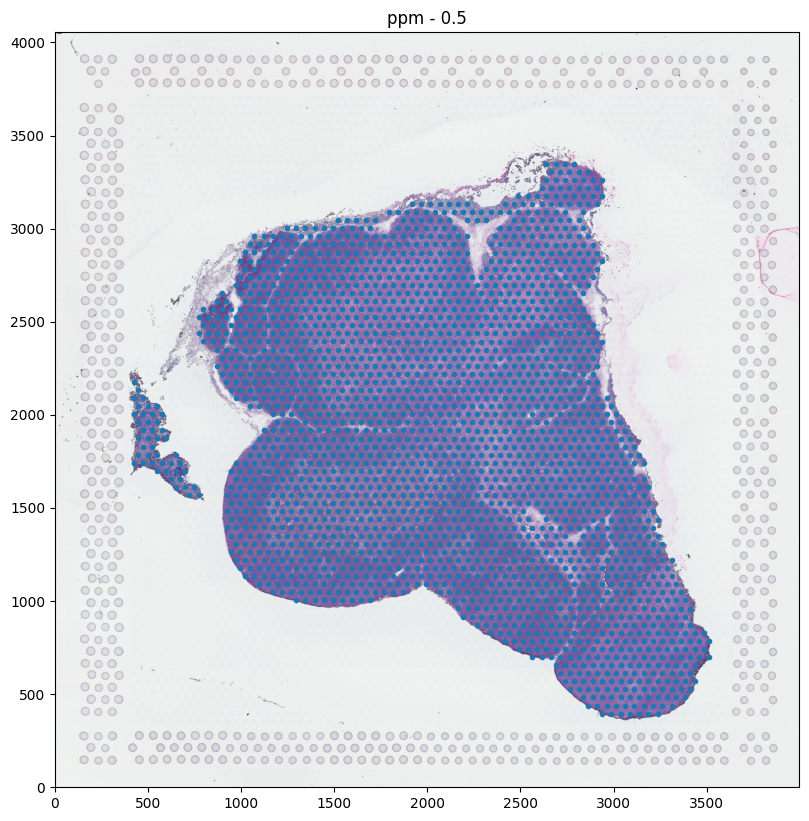

In [4]:
plt.figure(figsize=[10,10],dpi=100)
im,ppm,df = tt.read_visium(SpaceRanger_dir_path=vis_path+'imagespot_preprocessing/',use_resolution='hires5K',res_in_ppm=0.5)
coordinates = np.vstack((df[5],df[4]))
plt.imshow(im,origin='lower')
plt.plot(coordinates[0,:],coordinates[1,:],'.')
plt.title( 'ppm - '+str(ppm))

# adata = AnnVis[AnnVis.obs['in_tissue']==True]

In [5]:
# define annotations Lv0 
annodict = {
    'unassigned':'yellow',
    'Artifacts':'black',
    'Medulla':'green',
    'Cortex':'cyan',
    'Edge':'brown',
    'HS':'magenta',
    'Vessels':'blue',
    'PVS':'red',
    'Other':'orange',
}
result = np.zeros(im.shape[:2], dtype=np.uint8)

# proceed to semiautomated annotations

In [10]:
# generate automated labels from markers

# these marker genes would be used to train the classifier in later stages or just to define the annotations if going with the manual option 
gene_markers = { 
    'Medulla' : 'AIRE',
    'Cortex' : 'ARPP21',
    # 'HS' : 'IVL',
    # 'Vessels' : 'CD34',
}
labels_per_marker = { # how many spots per marker gene
    'Medulla' : 50,
    'Cortex' : 150,
    # 'HS' : 15,
    # 'Vessels' : 15,
}
r = 100

AIRE
ARPP21


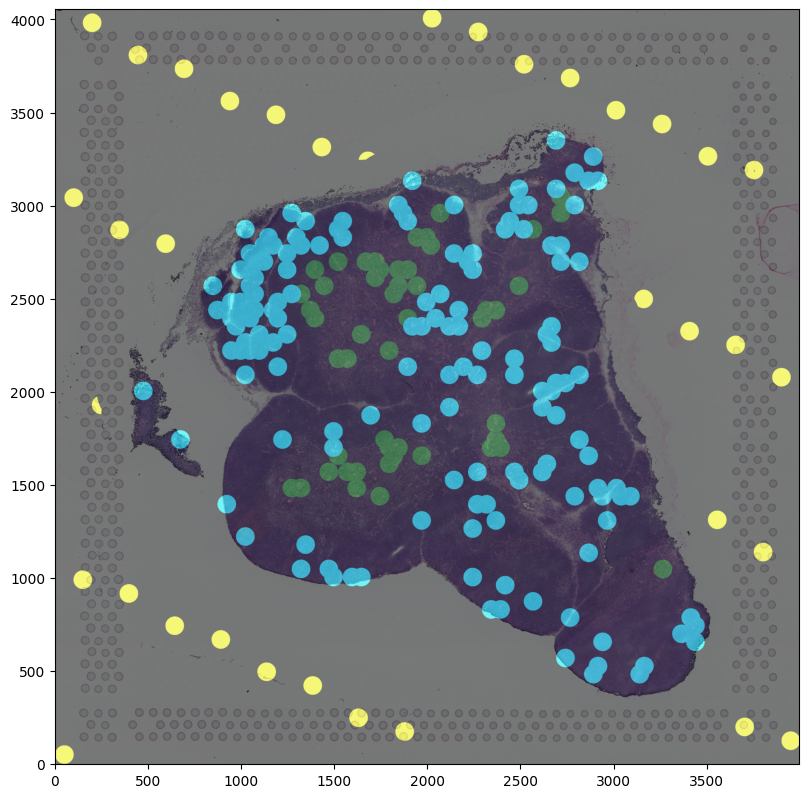

In [23]:
adata = sc.read_visium(vis_path,count_file='raw_feature_bc_matrix.h5')
adata = adata[df.index.intersection(adata.obs.index)]
training_labels = tt.background_labels(im.shape[:2],coordinates,every_x_spots = 100,r=r*ppm) # generate background labels 
training_labels_rgb = tt.rgb_from_labels(training_labels,colors=list(annodict.values()))
training_labels = tt.gene_labels(adata,df,training_labels,gene_markers,annodict,r*ppm,labels_per_marker)
training_labels_rgb = tt.rgb_from_labels(training_labels,colors=list(annodict.values()))
out = tt.overlay_lebels(im,training_labels_rgb,alpha=0.5)

# Step 2 - (optional) Predict regions from image

## scribble initial annotations

In [6]:
p, render_dict = tt.scribbler(im,annodict,plot_scale=1)
def app(doc):
    global p
    doc.add_root(p)
    
host = '5013' 
import socket
show(app,notebook_url=f'{socket.gethostname()}:'+host) # determine if working on a server or local environment, if working on a local pc - 'local', while working on server instance indicate the port number e.g. 5011 (string)
print('wait for it.. can take a few tens of seconds on farm...')

wait for it.. can take a few tens of seconds on farm...


## plot scribble anotations  

unassigned
Artifacts
Medulla
Cortex
Edge
HS
Vessels
PVS


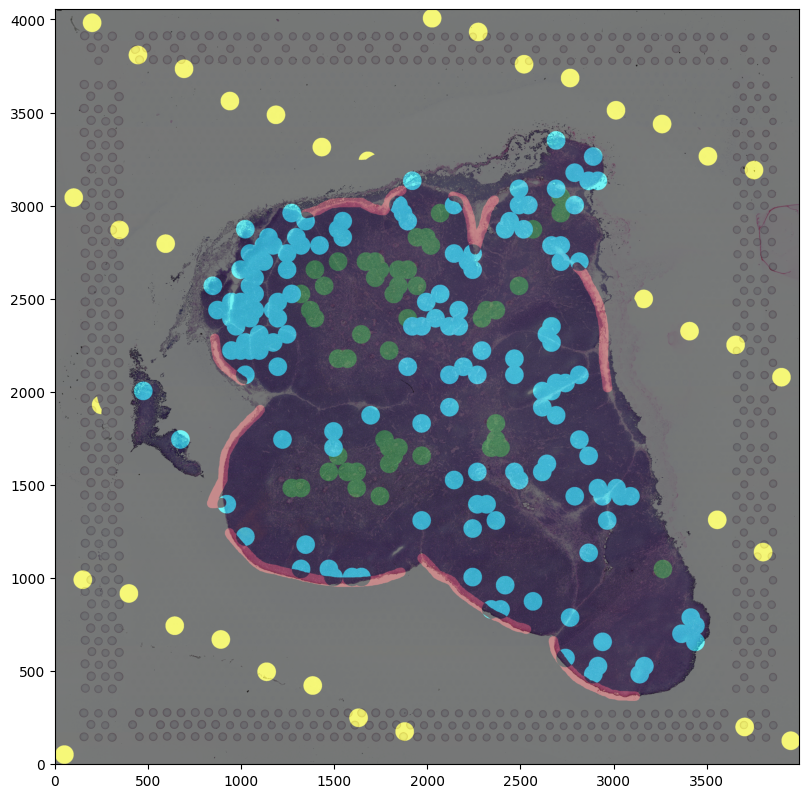

In [27]:
line_width = 100 # microns
training_labels_scrib = tt.scribble_to_labels(im,render_dict,line_width=line_width*ppm)
training_labels = training_labels + training_labels_scrib
training_labels_rgb = tt.rgb_from_labels(training_labels,colors=list(annodict.values()))
out = tt.overlay_lebels(im,training_labels_rgb,alpha=0.5)

## run the RF classifier 

CPU times: user 3min 10s, sys: 24 s, total: 3min 34s
Wall time: 55.5 s


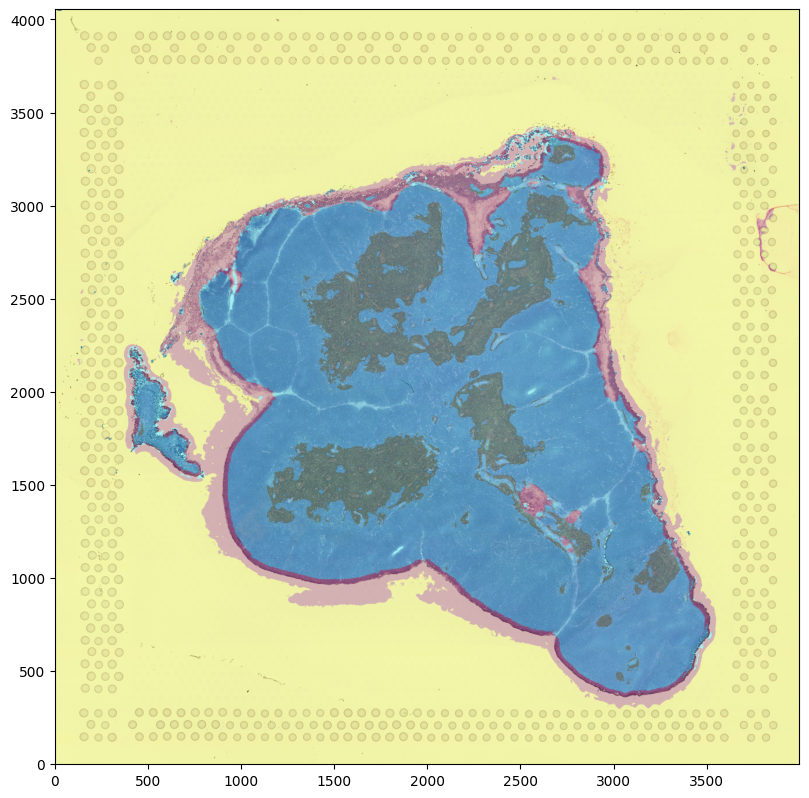

In [28]:
%%time

# this step takes about 30s to 5 min depending on number of training areas and resolution  
result = tt.sk_rf_classifier(im,training_labels)
# plot result 
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_lebels(im,result_rgb,alpha=0.7)

# Step 3 - Manually draw annotations or Correct forest annotations (Step 2)

## optinal - load a previuos annotated image 

In [147]:
result,annotations_level_0_labels,ppm,annodict = tt.load_annotation(vis_path+'/imagespot_preprocessing/tissue_annotations/','annotations_level_0',load_colors=True)
# annodict = {
#     'unassigned':'yellow',
#     'Artifacts':'black',
#     'Medulla':'green',
#     'Cortex':'cyan',
#     'Edge':'brown',
#     'HS':'magenta',
#     'Vessels':'blue',
#     'PVS':'red',
#     'Other':'orange',
# }

loaded annotation image - annotations_level_0 size - (4055, 3998)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}


In [8]:
# at this stage, if you are adding annotations make sure they come after the current ones otherwise it will mess up everything
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_lebels(im,result_rgb,alpha=0.5,show=False)
tabs,render_dict = tt.annotator(im,out_img,anno_dict=annodict,fig_downsize_factor=4)
# plotting
def app(doc):
    global tabs
    doc.add_root(tabs)
show(app)
print('wait for it.. can take a few tens of seconds on farm... (double time of the former plot)')

wait for it.. can take a few tens of seconds on farm... (double time of the former plot)


## update annotations 

In [143]:
out_img, result = tt.update_annotator(im,result,anno_dict=annodict,render_dict=render_dict,alpha=0.5)

## done? great. not done? return to Step 3 and repeat until happy :) 

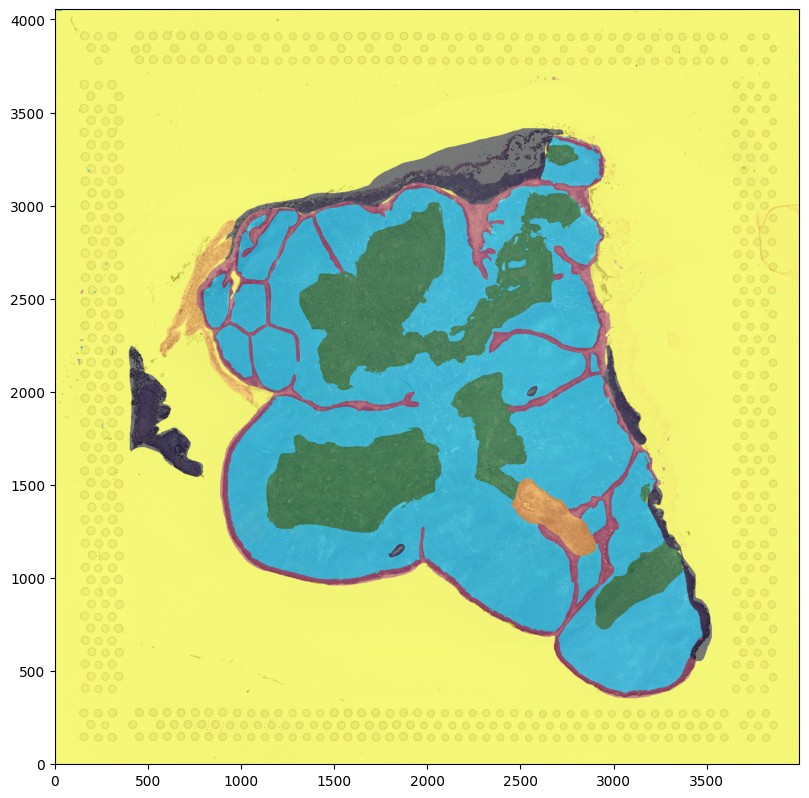

In [144]:
# plot result 
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_lebels(im,result_rgb,alpha=0.5)

## save annotation 

In [145]:
isExist = os.path.exists(vis_path+'tissue_annotations')
if not(isExist):
    os.mkdir(vis_path+'/imagespot_preprocessing/tissue_annotations')
    
tt.save_annotation(
    folder=vis_path+'/imagespot_preprocessing/tissue_annotations/',
    label_image=result,
    file_name='annotations_level_0',
    anno_names=list(annodict.keys()),
    anno_colors=list(annodict.values()),
    ppm = ppm,
)

## load annotations

loaded annotation image - annotations_level_0 size - (4055, 3998)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}
[1 2 3 4 5 9]


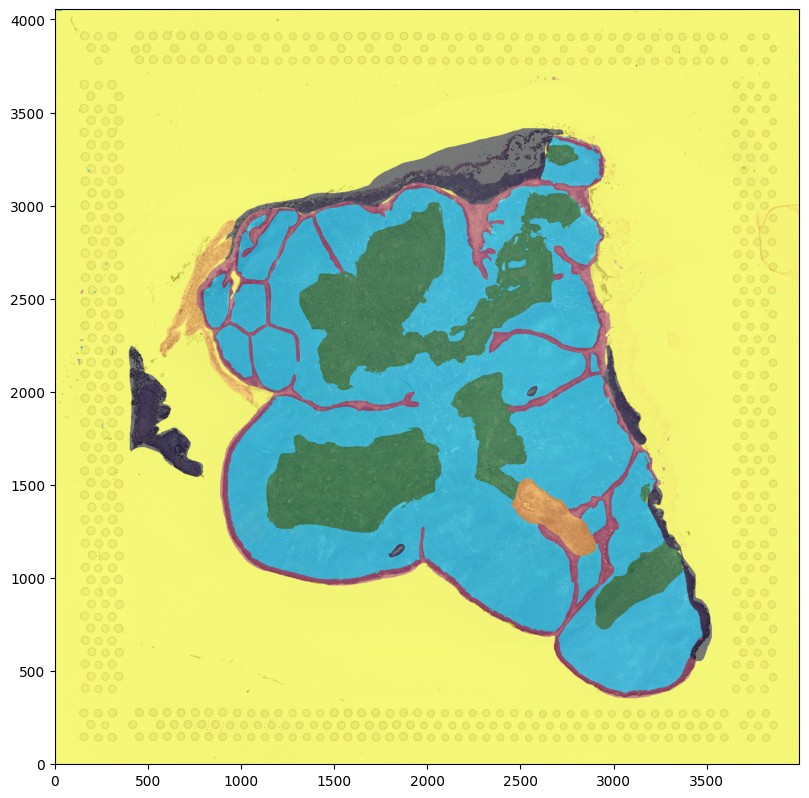

In [146]:
# load tissue annotations from jupyter annotator 
annotations_level_0,annotations_level_0_labels,ppm,annodict = tt.load_annotation(vis_path+'/imagespot_preprocessing/tissue_annotations/','annotations_level_0',load_colors=True)
# annotations_level_0[np.where(annotations_level_0==9)] = 1
im,ppm,positions = tt.read_visium(SpaceRanger_dir_path=vis_path+'/imagespot_preprocessing/',use_resolution='hires5K',res_in_ppm=ppm)

result_rgb = tt.rgb_from_labels(annotations_level_0,colors=list(annodict.values()))
out_img = tt.overlay_lebels(im,result_rgb,alpha=0.5)
print(np.unique(annotations_level_0))


loaded annotation image - annotations_level_1 size - (4055, 3998)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red'}
[1 6 8]


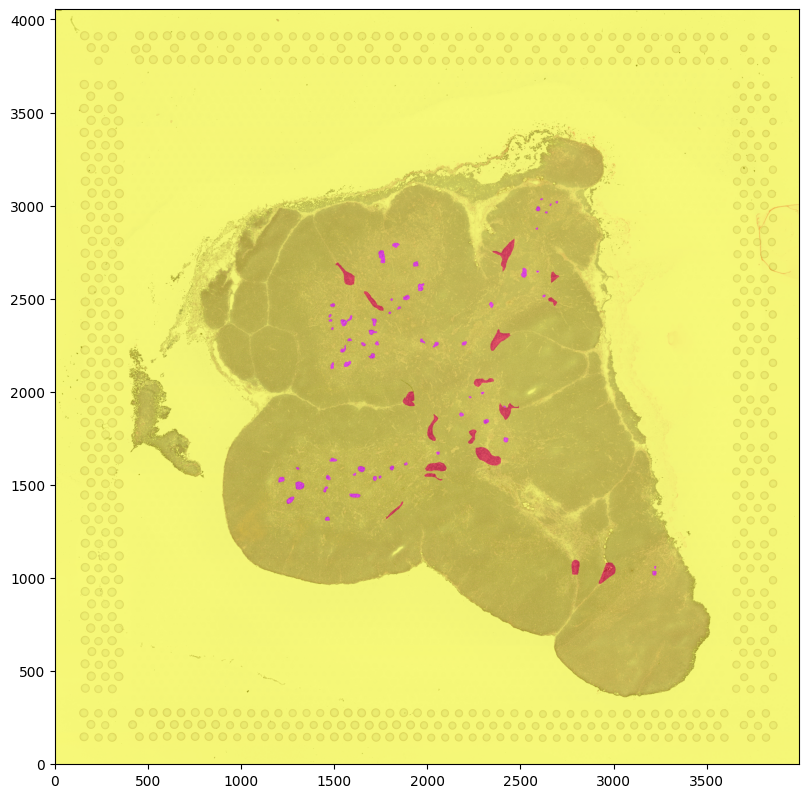

In [127]:
annotations_level_1,annotations_level_1_labels,ppm,annodict = tt.load_annotation(vis_path+'/imagespot_preprocessing/tissue_annotations/','annotations_level_1',load_colors=True)
result_rgb = tt.rgb_from_labels(annotations_level_1,colors=list(annodict.values()))
out_img = tt.overlay_lebels(im,result_rgb,alpha=0.5)
print(np.unique(annotations_level_1))

## migrate annotations to hi res grid sapce 


In [149]:
%%time
# it's critical not to split cell part and recalculate the df everytime you cahnge the dist2cluster resolution - I have an overflow bug somewhere that I need to fix
spot_diameter = 30 # don't go crazy here avoid under 15um spots 
df = tt.grid_anno(
    im,
    [annotations_level_0,annotations_level_1],
    ['annotations_level_0','annotations_level_1'],
    [annotations_level_0_labels,annotations_level_1_labels],
    spot_diameter=spot_diameter,
    pixels_per_micron=ppm
)
df

generating grid with spot size - 30, with resolution of - 0.5 ppm
annotations_level_0


71820it [00:10, 6771.74it/s]


annotations_level_1


71820it [00:10, 7127.89it/s]


CPU times: user 21.9 s, sys: 292 ms, total: 22.2 s
Wall time: 22 s


,x,y,annotations_level_0,annotations_level_0_number,annotations_level_1,annotations_level_1_number
index,,,,,,
0,15.0,15.000000,unassigned,1,unassigned,1
1,15.0,29.962826,unassigned,1,unassigned,1
2,15.0,44.925652,unassigned,1,unassigned,1
3,15.0,59.888477,unassigned,1,unassigned,1
4,15.0,74.851303,unassigned,1,unassigned,1
...,...,...,...,...,...,...
71815,3983.0,3987.648682,unassigned,1,unassigned,1
71816,3983.0,4002.611572,unassigned,1,unassigned,1
71817,3983.0,4017.574463,unassigned,1,unassigned,1


In [150]:
# remove background spots
df = df.iloc[np.where(df['annotations_level_0']!='unassigned')[0],:]

In [151]:
from scipy.spatial import distance_matrix, distance
a = np.vstack([df['x'],df['y']]).astype(int)
distM = distance.cdist(a.T,a.T, metric='euclidean')

calculating distances
Artifacts
Cortex
Edge
Medulla
Other
HS
PVS
unassigned


{'HS': array([1240.10201193,  995.05024999,  821.62339305, ...,  357.4143254 ,
         348.5111189 ,  340.03676272]),
 'PVS': array([1485.49823292, 1514.01783345, 1435.57131484, ...,  556.51235386,
         550.61874287,  545.07430686]),
 'unassigned': array([0., 0., 0., ..., 0., 0., 0.])}

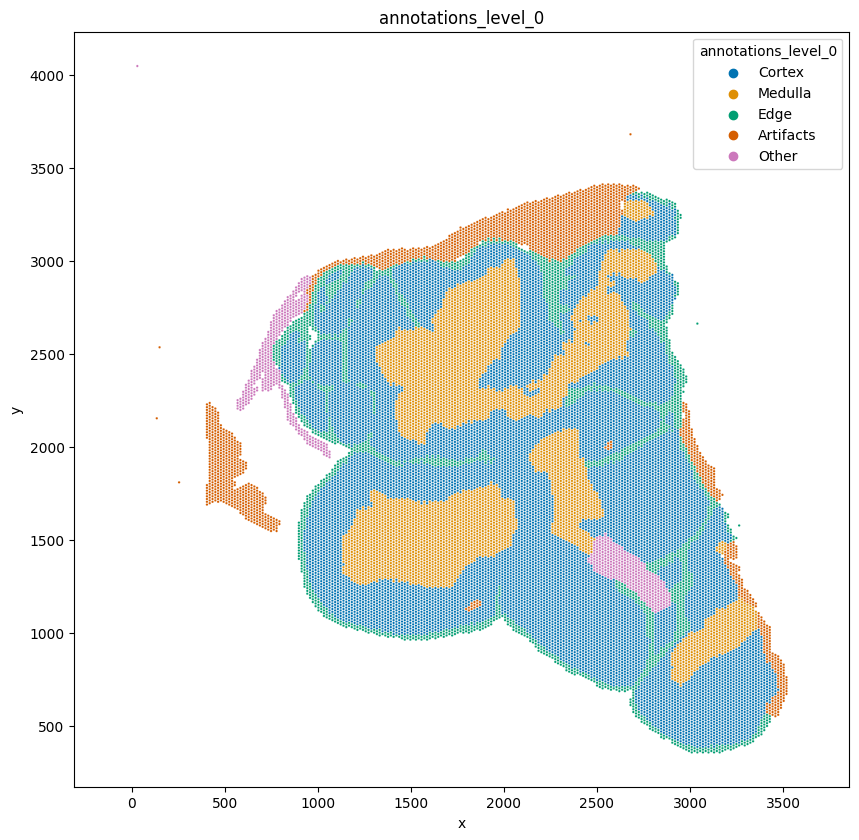

In [152]:
print('calculating distances')
dist2cluster_0 = tt.dist2cluster(df,annotation='annotations_level_0',distM=distM,resolution=5) # calculate minimum median distance of each spot to clusters 
tt.dist2cluster(df,annotation='annotations_level_1',distM=distM,resolution=1) # calculate minimum median distance of each spot to clusters 
tt.plot_grid(df,annotation='annotations_level_0',figsize=[10,10],spotsize=3)

<Figure size 1000x1000 with 0 Axes>

<AxesSubplot:xlabel='x', ylabel='y'>

(-144.4397705078125, 3693.2351806640627, 174.72723846435545, 4231.917750549316)

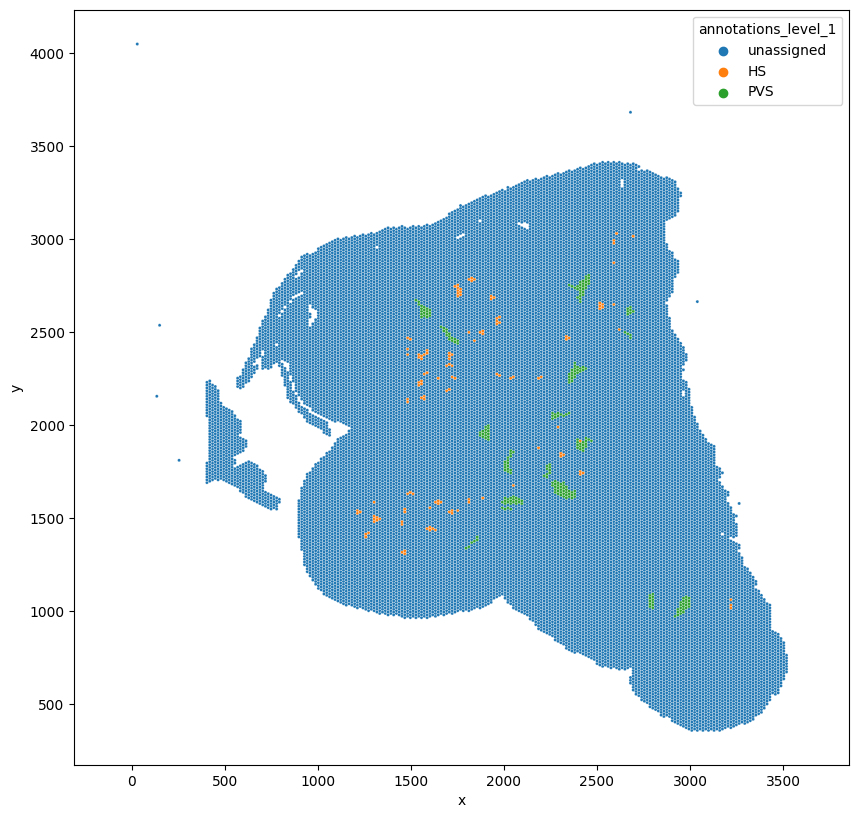

In [153]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(dpi=100, figsize=[10,10])
sns.scatterplot(df['x'],df['y'],hue=df['annotations_level_1'],s=5)
plt.grid(False)
plt.axis('equal')
plt.show()


Sub-Capsular
-0.66,-0.59
Cortical level I
-0.59,-0.55
Cortical level II
-0.55,-0.4
Cortical level III
-0.4,-0.3
Cortical CMJ
-0.3,0.05
Medullar CMJ
0.05,0.5
Medullar level I
0.5,0.6
Medullar level II
0.6,0.7
Medullar level III
0.7,0.75


Cortical level II     4919
Cortical CMJ          3482
Capsular              3405
Cortical level I      2486
Sub-Capsular          2479
Medullar CMJ          2095
Cortical level III    1751
Medullar level II     1573
Medullar level I      1305
Medullar level III    1009
Medullar Deep          173
Name: manual_bin_cma_v2, dtype: int64

<AxesSubplot:>

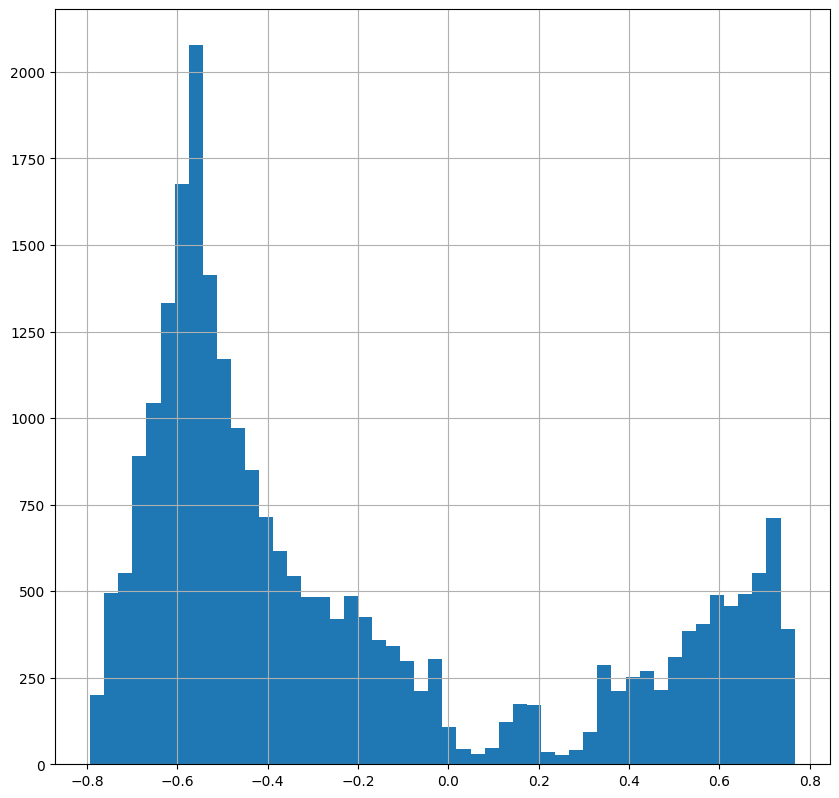

In [154]:
import seaborn as sns
ct_order = ['Capsular','Sub-Capsular','Cortical level I','Cortical level II','Cortical level III','Cortical CMJ','Medullar CMJ','Medullar level I','Medullar level II','Medullar level III','Medullar Deep']
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("tab20", len(ct_order)))[range(len(ct_order))]))
# axis v2
fcm = 0.8
fce = 0.2
CorticoMedullarDistall = vm.axis_2p_norm(dist2cluster_0,['Cortex','Medulla'])
CorticoEdgeDistAxisall = vm.axis_2p_norm(dist2cluster_0,['Edge','Cortex'])
CorticoMedullarAxisall = np.sum([fcm*CorticoMedullarDistall,fce*CorticoEdgeDistAxisall],axis=0)
df['cma_v2'] = CorticoMedullarAxisall
# binned axis
ct2_values = [-0.66,-0.59,-0.55,-0.4,-0.3,0.05,0.5,0.6,0.7,0.75]
df = vm.bin_axis(ct_order ,ct2_values,df,'cma_v2')   
df.loc[df['annotations_level_0']=='Edge','manual_bin_cma_v2'] = 'Capsular'
df['manual_bin_cma_v2'].value_counts()
df['cma_v2'].hist(bins=50)
plt.show()

<Figure size 700x700 with 0 Axes>

Text(0.5, 1.0, 'cma_v2')

(-144.4397705078125, 3693.2351806640627, 174.72723846435545, 4231.917750549316)

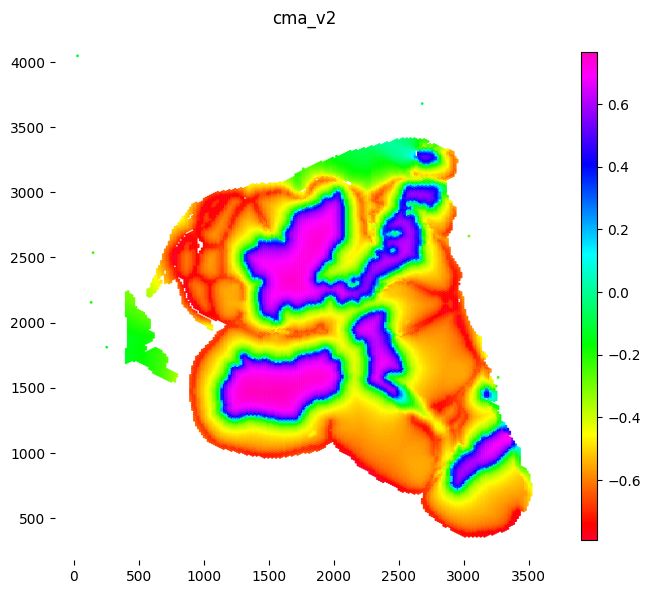

In [155]:
# fig, ax = plt.subplots()
plt.figure(dpi=100, figsize=[7,7])
plt.scatter(df['x'],df['y'],c=df['cma_v2'],cmap='gist_rainbow',s=1,)
# plt.scatter(df['x'],df['y'],c=(df['tissue_annotations']=='Cortex'),s=8,)
plt.grid(False)
plt.title('cma_v2')
plt.colorbar(aspect=30,fraction=0.03)
plt.axis('equal')
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
plt.show()

<Figure size 1000x1000 with 0 Axes>

<AxesSubplot:xlabel='x', ylabel='y'>

Text(0.5, 1.0, 'cma_bin_manual_v2')

(-144.4397705078125, 3693.2351806640627, 174.72723846435545, 4231.917750549316)

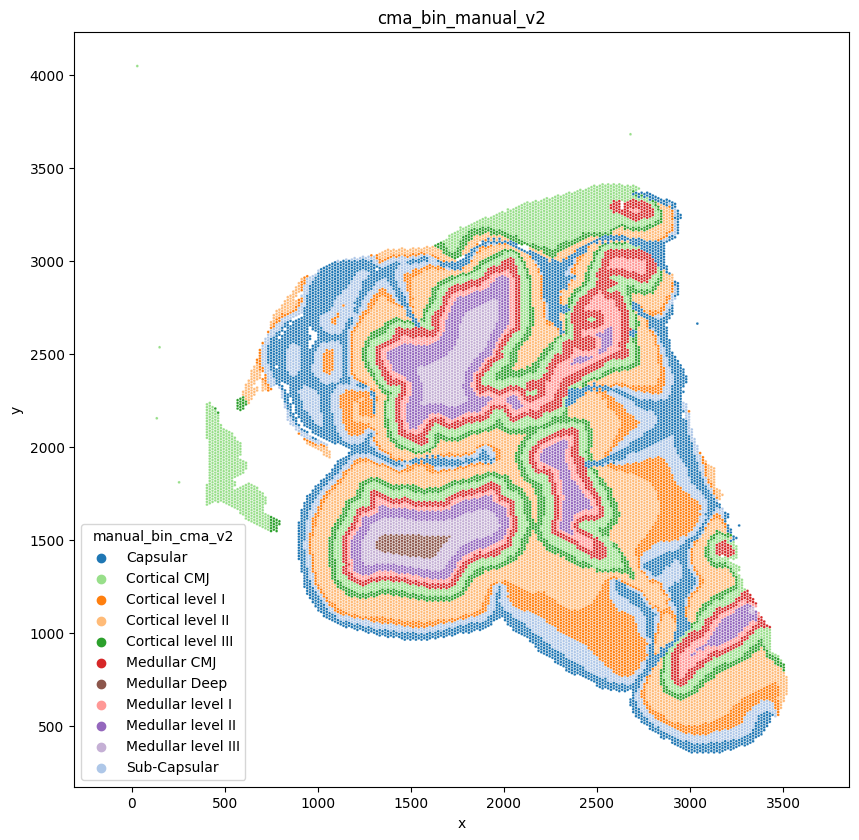

In [156]:
plt.figure(dpi=100, figsize=[10,10])
sns.scatterplot(df['x'],df['y'],hue=df['manual_bin_cma_v2'],palette=ct_color_map,s=4,)
plt.grid(False)
plt.title('cma_bin_manual_v2')
# plt.colorbar(aspect=30,fraction=0.03)
plt.axis('equal')


In [157]:
positions[4]

0
GTGGCGTGCACCAGAG-1     395.091684
GGTCCCATAACATAGA-1     395.072769
TGCATGGCAGTCTTGC-1     395.053854
AGCTGCATTTGAGGTG-1     395.034939
CCATCATAAGAACAGG-1     395.016024
                         ...     
GTTTCTAGAGGCGCGG-1    3348.992712
TACAAGGGCTTCTTTA-1    3305.544647
ACAGGCACGGATCCTT-1    3348.973797
CCCAAGTCATTACACT-1    3305.525732
GGATGGCTTGAAGTAT-1    3305.506816
Name: 4, Length: 2359, dtype: float64

## project annotation and distances to visium spots 

make sure the coordinate systems are alligned e.g. axes are not flipped


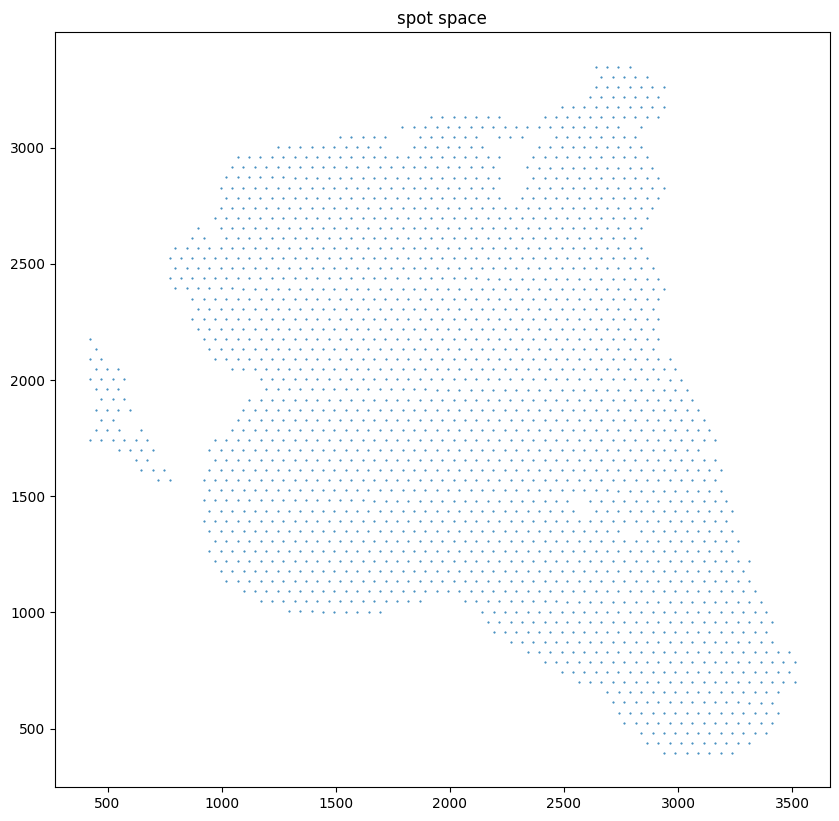

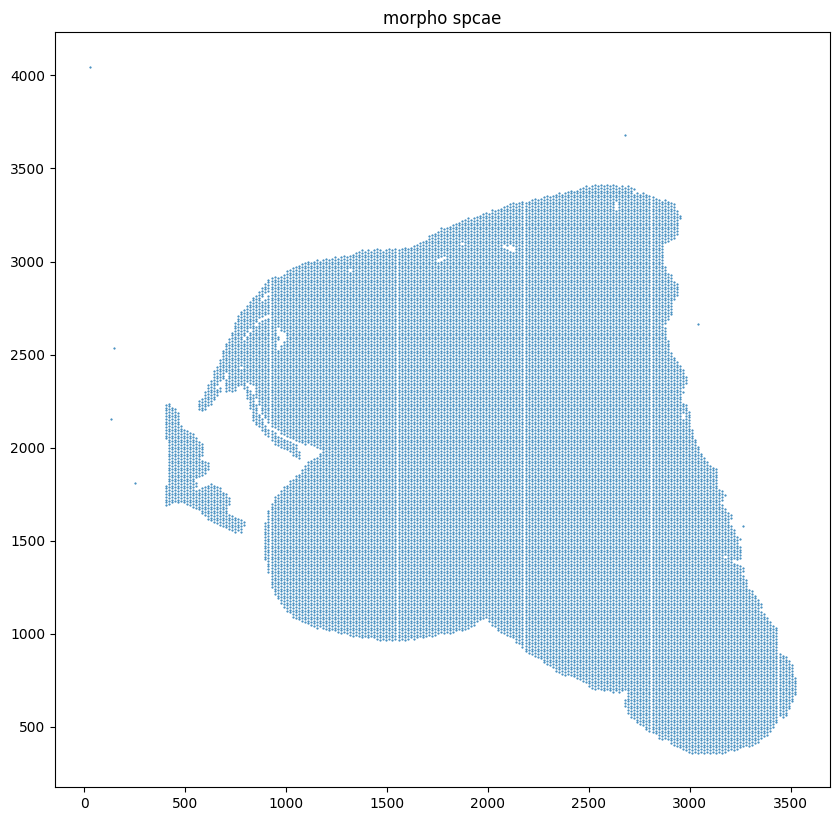

migrating - annotations_level_0 to segmentations
migrating - annotations_level_0_number to segmentations
migrating - annotations_level_1 to segmentations
migrating - annotations_level_1_number to segmentations
migrating - L2_dist_annotations_level_0_Artifacts to segmentations
migrating - L2_dist_annotations_level_0_Cortex to segmentations
migrating - L2_dist_annotations_level_0_Edge to segmentations
migrating - L2_dist_annotations_level_0_Medulla to segmentations
migrating - L2_dist_annotations_level_0_Other to segmentations
migrating - L2_dist_annotations_level_1_HS to segmentations
migrating - L2_dist_annotations_level_1_PVS to segmentations
migrating - cma_v2 to segmentations
migrating - manual_bin_cma_v2 to segmentations
migrating - manual_bin_cma_v2_int to segmentations


,1,2,3,4,5,annotations_level_0,annotations_level_0_number,annotations_level_1,annotations_level_1_number,L2_dist_annotations_level_0_Artifacts,L2_dist_annotations_level_0_Cortex,L2_dist_annotations_level_0_Edge,L2_dist_annotations_level_0_Medulla,L2_dist_annotations_level_0_Other,L2_dist_annotations_level_1_HS,L2_dist_annotations_level_1_PVS,cma_v2,manual_bin_cma_v2,manual_bin_cma_v2_int
0,,,,,,,,,,,,,,,,,,,
GTGGCGTGCACCAGAG-1,1.0,1.0,101.0,395.091684,2938.290111,Edge,5,unassigned,1,523.086991,33.541020,16.552945,337.333663,738.383369,683.275933,576.195279,-0.726685,Capsular,0
GGTCCCATAACATAGA-1,1.0,1.0,103.0,395.072769,2988.082720,Edge,5,unassigned,1,466.840444,17.000000,16.552945,339.991176,751.473220,660.504353,580.862290,-0.729656,Capsular,0
TGCATGGCAGTCTTGC-1,1.0,1.0,105.0,395.053854,3037.875330,Cortex,4,unassigned,1,428.207893,16.552945,17.000000,355.578402,769.352975,653.287073,595.221807,-0.724937,Capsular,0
AGCTGCATTTGAGGTG-1,1.0,1.0,107.0,395.034939,3087.667939,Cortex,4,unassigned,1,384.603692,16.552945,26.627054,363.034434,774.406870,635.504524,599.166922,-0.684835,Capsular,0
CCATCATAAGAACAGG-1,1.0,1.0,109.0,395.016024,3137.460548,Edge,4,unassigned,1,333.054050,17.000000,16.552945,388.753135,793.918132,625.512590,618.385802,-0.738900,Capsular,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTTTCTAGAGGCGCGG-1,1.0,69.0,93.0,3348.992712,2738.469878,Cortex,5,unassigned,1,42.426407,16.552945,17.000000,39.924930,1837.042460,339.000000,615.906649,-0.328485,Cortical level III,4
TACAAGGGCTTCTTTA-1,1.0,68.0,94.0,3305.544647,2763.375739,Medulla,3,unassigned,1,96.046864,17.000000,40.853396,16.552945,1802.101274,300.509567,591.798952,0.104944,Medullar CMJ,5
ACAGGCACGGATCCTT-1,1.0,69.0,95.0,3348.973797,2788.262488,Edge,5,unassigned,1,83.630138,27.459060,16.552945,50.537115,1841.704645,341.087965,631.997627,-0.290124,Capsular,1


In [158]:
# calculate distance matrix between hires and visium spots
positions = vm.anno_to_visium_spots(
    df_spots=positions,
    df_grid=df,
)
positions

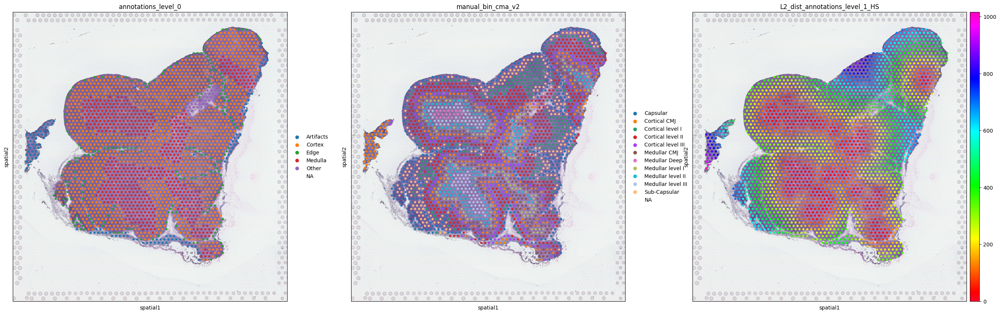

In [164]:
import scanpy as sc
adata_vis = sc.read_h5ad(vis_path+'/imagespot_preprocessing/corrected_raw_adata.h5ad')
adata_vis.obs = pd.concat([adata_vis.obs,positions.iloc[:,5:]],axis=1)
sc.pl.spatial(adata_vis,color=['annotations_level_0','manual_bin_cma_v2','L2_dist_annotations_level_1_HS'],cmap='gist_rainbow')

In [160]:
adata_vis

AnnData object with n_obs × n_vars = 4992 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'annotations_level_0', 'annotations_level_0_number', 'annotations_level_1', 'annotations_level_1_number', 'L2_dist_annotations_level_0_Artifacts', 'L2_dist_annotations_level_0_Cortex', 'L2_dist_annotations_level_0_Edge', 'L2_dist_annotations_level_0_Medulla', 'L2_dist_annotations_level_0_Other', 'L2_dist_annotations_level_1_HS', 'L2_dist_annotations_level_1_PVS', 'cma_v2', 'manual_bin_cma_v2', 'manual_bin_cma_v2_int'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'annotations_level_0_colors', 'manual_bin_cma_v2_colors'
    obsm: 'spatial'